# Prosper Loan Data Exploration
## by Puneet Sharma

## Preliminary Wrangling

> This data set contains 113,937 loans with 81 variables on each loan, including loan amount, borrower rate (or interest rate), current loan status, borrower income, and many others..

In [1]:
# import all packages and set plots to be embedded inline
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sb

%matplotlib inline

> Loading dataset.

In [2]:
df = pd.read_csv('prosperLoanData.csv')

In [3]:
df.ListingCreationDate = pd.to_datetime(df.ListingCreationDate)

In [4]:
df.ClosedDate = pd.to_datetime(df.ClosedDate)

In [5]:
df.loc[df.EmploymentStatus == 'Not available', 'EmploymentStatus'] = np.nan

In [6]:
df.loc[df.BorrowerAPR.isna(), 'BorrowerAPR'] = np.nan

In [7]:
df.DateCreditPulled = pd.to_datetime(df.DateCreditPulled)

In [8]:
df.FirstRecordedCreditLine = pd.to_datetime(df.FirstRecordedCreditLine)

In [9]:
df.LoanOriginationDate = pd.to_datetime(df.LoanOriginationDate)

>Feature Engineering

In [21]:
df['ListingCreationYear'] = df.ListingCreationDate.apply(lambda x: int(str(x).split()[0].split('-')[0]))

In [33]:
df_loan_amt_each_year = df.groupby(['ListingCategory (numeric)', 'ListingCreationYear']).LoanOriginalAmount.sum().reset_index(name="sum")
df_loan_amt_each_year.head()

,ListingCategory (numeric),ListingCreationYear,sum
0,0,2005,88687
1,0,2006,30100789
2,0,2007,75795140
3,0,2011,44505
4,0,2012,16000


In [34]:
df_loan_amt_each_year_2 = df_loan_amt_each_year.groupby('ListingCreationYear')['sum'].sum().reset_index(name="sum")
df_loan_amt_each_year_2

,ListingCreationYear,sum
0,2005,88687
1,2006,30100789
2,2007,81670928
3,2008,67180398
4,2009,9692013
5,2010,26775582
6,2011,76711783
7,2012,154033169
8,2013,375740433
9,2014,127900565


In [48]:
df['LoanGoodBad'] = df.LoanStatus.apply(lambda x: 1 if x in ['Completed', 'Current', 'FinalPaymentInProgress'] else 0)

In [47]:
df['CreditHistory'] = ((df.DateCreditPulled - df.FirstRecordedCreditLine)/np.timedelta64(1, 'M'))

In [49]:
df.loc[df.CreditHistory.notnull(), 'CreditHistory'] = df[df.CreditHistory.notnull()].CreditHistory.astype(int)

In [51]:
df['IsBorrowerHomeownerNum'] = df.IsBorrowerHomeowner.apply(lambda x: 1 if x else 0)

In [52]:
df_numeric = df[['BorrowerAPR', 'BorrowerRate', 'LenderYield', 'EmploymentStatusDuration', 'IsBorrowerHomeownerNum', 'CreditScoreRangeLower', 'CreditScoreRangeUpper', 'CurrentCreditLines', 'OpenCreditLines', 'TotalCreditLinespast7years', 'OpenRevolvingAccounts', 'OpenRevolvingMonthlyPayment', 'InquiriesLast6Months', 'TotalInquiries', 'CurrentDelinquencies', 'AmountDelinquent', 'RevolvingCreditBalance', 'BankcardUtilization', 'AvailableBankcardCredit', 'DebtToIncomeRatio', 'LoanMonthsSinceOrigination', 'LoanOriginalAmount', 'MonthlyLoanPayment', 'LP_CustomerPayments', 'LP_CustomerPrincipalPayments', 'LP_InterestandFees', 'LP_ServiceFees', 'LP_CollectionFees', 'LP_GrossPrincipalLoss', 'LP_NetPrincipalLoss', 'LP_NonPrincipalRecoverypayments', 'PercentFunded', 'Recommendations', 'InvestmentFromFriendsCount', 'InvestmentFromFriendsAmount', 'Investors', 'CreditHistory', 'LoanGoodBad']]

In [53]:
def check_income(val):
    if val in ['Not displayed', 'Not employed', '$0']:
        return 0
    elif val in ['$25,000-49,999', '$1-24,999']:
        return 1
    else:
        return 2

In [54]:
df_numeric['IncomeRangeCat'] = df.IncomeRange.apply(check_income)

/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  """Entry point for launching an IPython kernel.


In [66]:
df['IncomeRangeCat'] = df.IncomeRange.apply(check_income)

In [56]:
dummy = pd.get_dummies(df.LoanStatus)

In [57]:
df_numeric = pd.concat([df_numeric, dummy], axis=1)

In [58]:
df_numeric.head()

,BorrowerAPR,BorrowerRate,LenderYield,EmploymentStatusDuration,IsBorrowerHomeownerNum,CreditScoreRangeLower,CreditScoreRangeUpper,CurrentCreditLines,OpenCreditLines,TotalCreditLinespast7years,...,Completed,Current,Defaulted,FinalPaymentInProgress,Past Due (1-15 days),Past Due (16-30 days),Past Due (31-60 days),Past Due (61-90 days),Past Due (91-120 days),Past Due (>120 days)
0,0.16516,0.1580,0.1380,2.0,1,640.0,659.0,5.0,4.0,12.0,...,1,0,0,0,0,0,0,0,0,0
1,0.12016,0.0920,0.0820,44.0,0,680.0,699.0,14.0,14.0,29.0,...,0,1,0,0,0,0,0,0,0,0
2,0.28269,0.2750,0.2400,NaN,0,480.0,499.0,NaN,NaN,3.0,...,1,0,0,0,0,0,0,0,0,0
3,0.12528,0.0974,0.0874,113.0,1,800.0,819.0,5.0,5.0,29.0,...,0,1,0,0,0,0,0,0,0,0
4,0.24614,0.2085,0.1985,44.0,1,680.0,699.0,19.0,19.0,49.0,...,0,1,0,0,0,0,0,0,0,0


In [59]:
corr = df_numeric.corr()

### What is the structure of your dataset?

> 113937, 85

### What is/are the main feature(s) of interest in your dataset?

> ['LoanStatus', 'BorrowerAPR', 'BorrowerRate', 'LenderYield', 'ListingCategory (numeric)', 'Occupation', 'EmploymentStatus', 'EmploymentStatusDuration', 'IsBorrowerHomeowner', 'CreditScoreRangeLower', 'CreditScoreRangeUpper', 'FirstRecordedCreditLine', 'DateCreditPulled', 'CurrentCreditLines', 'OpenCreditLines', 'TotalCreditLinespast7years', 'OpenRevolvingAccounts', 'OpenRevolvingMonthlyPayment', 'InquiriesLast6Months', 'TotalInquiries', 'CurrentDelinquencies', 'AmountDelinquent', 'RevolvingCreditBalance', 'BankcardUtilization', 'AvailableBankcardCredit', 'DebtToIncomeRatio', 'IncomeRange', 'LoanMonthsSinceOrigination', 'LoanOriginalAmount', 'MonthlyLoanPayment', 'LP_CustomerPayments', 'LP_CustomerPrincipalPayments', 'LP_InterestandFees', 'LP_ServiceFees', 'LP_CollectionFees', 'LP_GrossPrincipalLoss', 'LP_NetPrincipalLoss', 'LP_NonPrincipalRecoverypayments', 'PercentFunded', 'Recommendations', 'InvestmentFromFriendsCount', 'InvestmentFromFriendsAmount', 'Investors']

### What features in the dataset do you think will help support your investigation into your feature(s) of interest?

> ['LoanStatus', 'BorrowerRate', 'CreditScoreRangeUpper', 'TotalInquiries',
       'BankcardUtilization', 'LoanOriginalAmount', 'Investors',
       'IncomeRangeCat', 'LoanGoodBad']

## Univariate Exploration

> In this section, investigate distributions of individual variables. If
you see unusual points or outliers, take a deeper look to clean things up
and prepare yourself to look at relationships between variables.

In [10]:
base_color = sb.color_palette()[0]

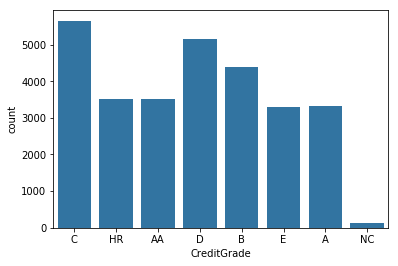

In [11]:
sb.countplot(x="CreditGrade", color=base_color, data=df);

>Above distribution shows how "Credit Grade" is distributed. 'C' Grade is given highest.

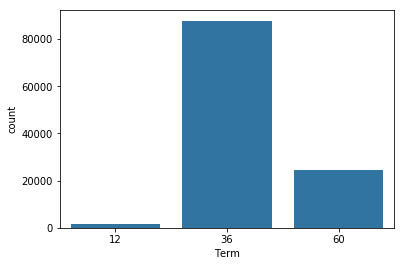

In [12]:
sb.countplot(x='Term', color=base_color, data=df);

>3 Years loan is most popular.

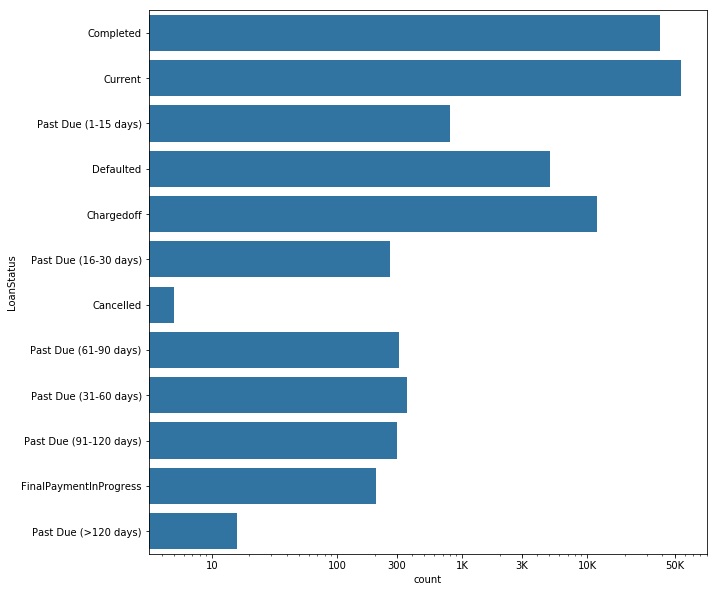

In [13]:
plt.figure(figsize=[10, 10])
sb.countplot(y='LoanStatus', color=base_color, data=df)
plt.xscale('log')
plt.xticks([10, 100, 300, 1000, 3000, 10000, 50000], ['10', '100', '300', '1K', '3K', '10K', '50K']);

>How Loan Status is distributed. Total count of each type of Loan Status.

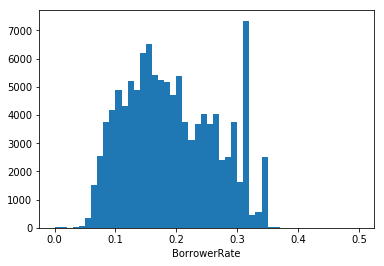

In [25]:
bin_edges = np.arange(0, df.BorrowerRate.max()+0.01, 0.01)
sb.distplot(df.BorrowerRate, bins=bin_edges, kde=False, hist_kws={'alpha': 1});

>Intrest Rate distributtion.

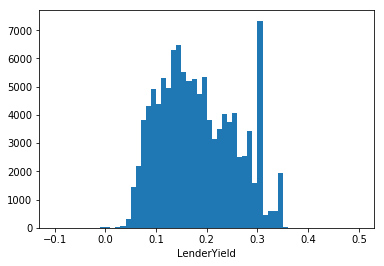

In [26]:
bin_edges = np.arange(-0.1, df.LenderYield.max()+0.01, 0.01)
sb.distplot(df.LenderYield, bins=bin_edges, kde=False, hist_kws={'alpha': 1});

>Watch how close match is Lender Yield with Interest rate.

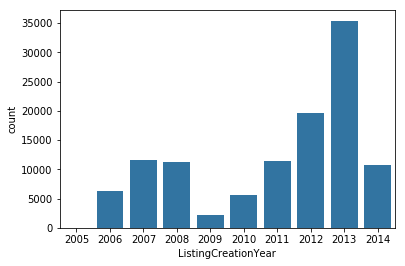

In [22]:
sb.countplot(x="ListingCreationYear", color=base_color, data=df);

>How many loans distributed each year.

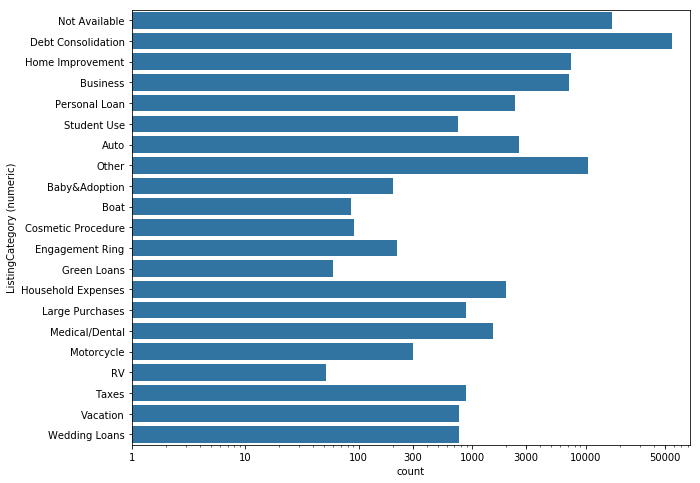

In [27]:
base_color = sb.color_palette()[0]
plt.figure(figsize=[10, 8])
sb.countplot(data=df, y='ListingCategory (numeric)', color=base_color);
y_tick_num = [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20]
y_tick = ['Not Available', 'Debt Consolidation', 'Home Improvement', 'Business', 'Personal Loan', 'Student Use', 'Auto', 'Other', 'Baby&Adoption', 'Boat', 'Cosmetic Procedure', 'Engagement Ring', 'Green Loans', 'Household Expenses', 'Large Purchases', 'Medical/Dental', 'Motorcycle', 'RV', 'Taxes', 'Vacation', 'Wedding Loans']
plt.xscale('log')
tick_locs = [1, 10, 100, 300, 1000, 3000, 10000, 50000]
plt.xticks(tick_locs, tick_locs)
plt.yticks(y_tick_num, y_tick);

>How many loans are distributed for different category. 'Debt Consolidation' is what people take most loan against.

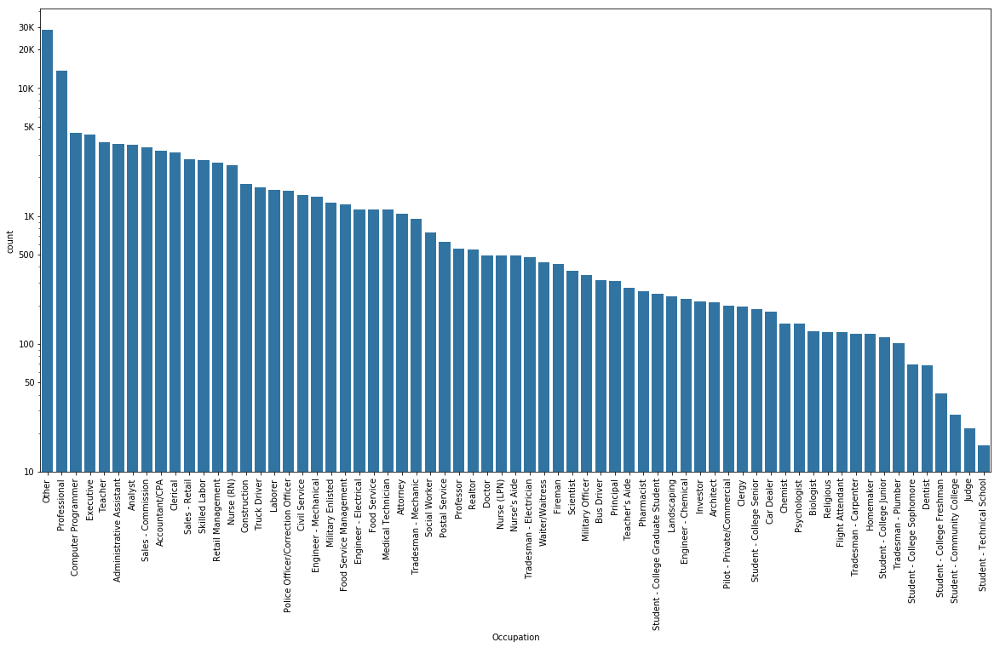

In [44]:
plt.figure(figsize=[20, 10])
sb.countplot(x="Occupation", color=base_color, order=df.Occupation.value_counts().index, data=df)
plt.yscale('log')
tick_locs = [10, 50, 100, 500, 1000, 5000, 10000, 20000, 30000]
tick_locs_t = ['10', '50', '100', '500', '1K', '5K', '10K', '20K', '30K']
plt.yticks(tick_locs, tick_locs_t)
plt.xticks(rotation=90);

>Which profession takes most loans

### Discuss the distribution(s) of your variable(s) of interest. Were there any unusual points? Did you need to perform any transformations?

> 1. Most loans are distributed in 2013.
> 2. Interest Rate looks uniformly distributed expect two peaks at the end.
> 3. Most loans are in 'current' or 'completed' state which is good sign for lender. But count of 'chargedoff' loans also higher.
> 4. Did log transformation to get more clear picture of types of loans and which people profession loans disribution.

### Of the features you investigated, were there any unusual distributions? Did you perform any operations on the data to tidy, adjust, or change the form of the data? If so, why did you do this?

> There are lot of categories for loan status. Created new column to shink it to two category to get better correlation.
> Also, changed income category.
> Created new columns "CreditHistory" and "LoanYear" to get better grouping.

## Bivariate Exploration

> In this section, investigate relationships between pairs of variables in your
data. Make sure the variables that you cover here have been introduced in some
fashion in the previous section (univariate exploration).

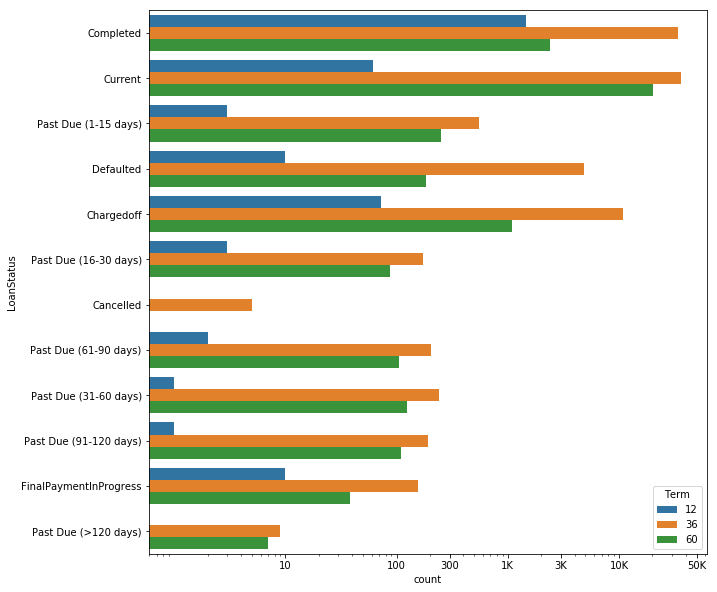

In [14]:
plt.figure(figsize=[10, 10])
sb.countplot(y='LoanStatus', hue='Term', data=df)
plt.xscale('log')
plt.xticks([10, 100, 300, 1000, 3000, 10000, 50000], ['10', '100', '300', '1K', '3K', '10K', '50K']);

>Adding loan duration to loan status. Clearly because there are lot of 3Year loans so more variations in status. 

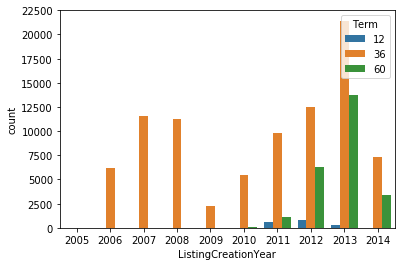

In [23]:
sb.countplot(x="ListingCreationYear", hue='Term', data=df);

>How many loans of different duration are provided each year.

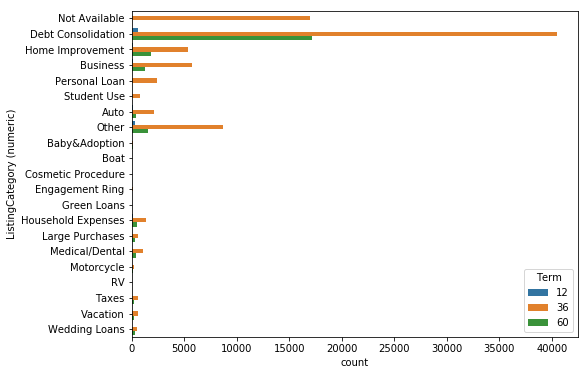

In [30]:
base_color = sb.color_palette()[0]
plt.figure(figsize=[8, 6])
sb.countplot(data=df, y='ListingCategory (numeric)', hue='Term');
x_tick_num = [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20]
x_tick = ['Not Available', 'Debt Consolidation', 'Home Improvement', 'Business', 'Personal Loan', 'Student Use', 'Auto', 'Other', 'Baby&Adoption', 'Boat', 'Cosmetic Procedure', 'Engagement Ring', 'Green Loans', 'Household Expenses', 'Large Purchases', 'Medical/Dental', 'Motorcycle', 'RV', 'Taxes', 'Vacation', 'Wedding Loans']
plt.yticks(x_tick_num, x_tick);

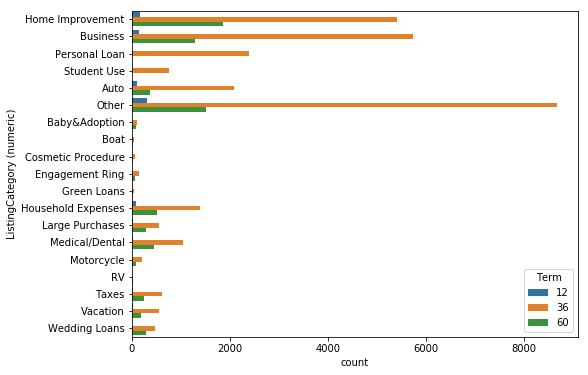

In [31]:
plt.figure(figsize=[8, 6])
sb.countplot(data=df[df['ListingCategory (numeric)']>1], y='ListingCategory (numeric)', hue='Term');
x_tick_num = [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18]
x_tick = ['Home Improvement', 'Business', 'Personal Loan', 'Student Use', 'Auto', 'Other', 'Baby&Adoption', 'Boat', 'Cosmetic Procedure', 'Engagement Ring', 'Green Loans', 'Household Expenses', 'Large Purchases', 'Medical/Dental', 'Motorcycle', 'RV', 'Taxes', 'Vacation', 'Wedding Loans']
plt.yticks(x_tick_num, x_tick);

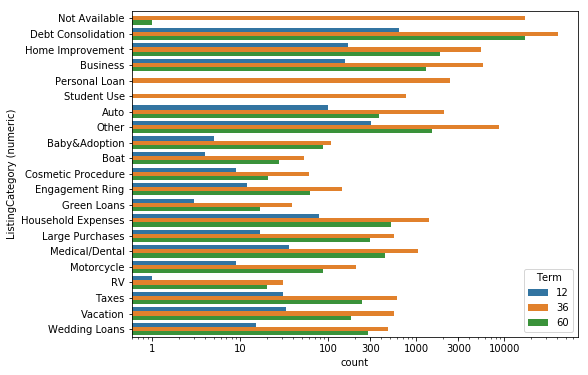

In [32]:
plt.figure(figsize=[8, 6])
sb.countplot(data=df, y='ListingCategory (numeric)', hue='Term');
y_tick_num = [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20]
y_tick = ['Not Available', 'Debt Consolidation', 'Home Improvement', 'Business', 'Personal Loan', 'Student Use', 'Auto', 'Other', 'Baby&Adoption', 'Boat', 'Cosmetic Procedure', 'Engagement Ring', 'Green Loans', 'Household Expenses', 'Large Purchases', 'Medical/Dental', 'Motorcycle', 'RV', 'Taxes', 'Vacation', 'Wedding Loans']
plt.xscale('log')
tick_locs = [1, 10, 100, 300, 1000, 3000, 10000]
plt.xticks(tick_locs, tick_locs)
plt.yticks(y_tick_num, y_tick);

>Which type of loan is popular and for what duration.

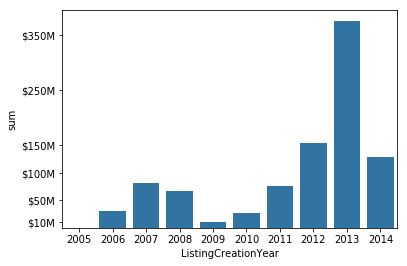

In [40]:
sb.barplot(data=df_loan_amt_each_year_2, x = 'ListingCreationYear', y='sum', color=base_color)
tick_locs = [10000000, 50000000, 100000000, 150000000, 250000000, 350000000]
tick_locs_t = ['$10M', '$50M', '$100M', '$150M', '$250M', '$350M']
plt.yticks(tick_locs, tick_locs_t);

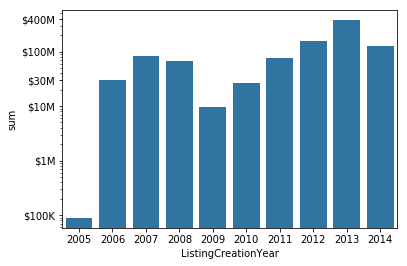

In [41]:
base_color = sb.color_palette()[0]
sb.barplot(data=df_loan_amt_each_year_2, x = 'ListingCreationYear', y='sum', color=base_color)
plt.yscale('log')
tick_locs = [100000, 1000000, 10000000, 30000000, 100000000, 400000000]
tick_locs_t = ['$100K', '$1M', '$10M', '$30M', '$100M', '$400M']
plt.yticks(tick_locs, tick_locs_t);

>Total how much loan given each year.

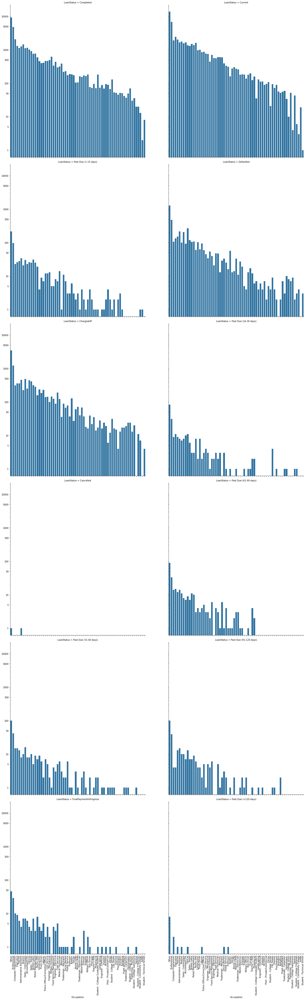

In [45]:
g = sb.FacetGrid(data = df, col='LoanStatus', col_wrap=2, height=10)
g.map(sb.countplot, 'Occupation', orient='h', order=df.Occupation.value_counts().index)
g.set(yscale='log')
y_ticks = [1, 5, 10, 50, 100, 500, 1000, 5000, 10000]
g.set(yticks=y_ticks, yticklabels=y_ticks)
for ax in g.axes.flat:
    for label in ax.get_xticklabels():
        label.set_rotation(90)

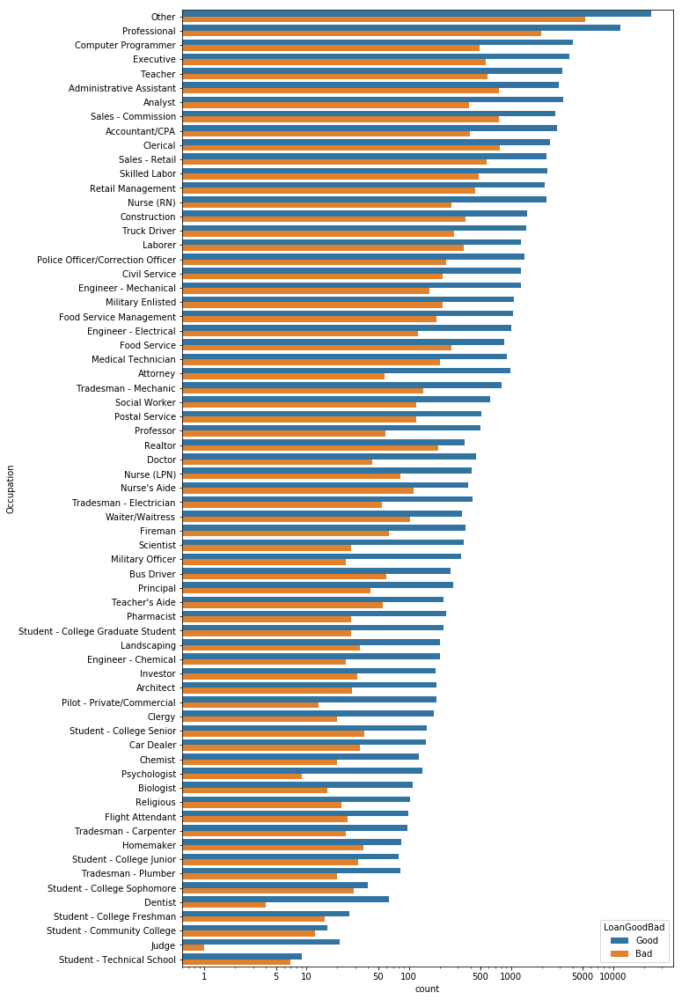

In [46]:
plt.figure(figsize=[10, 20])
sb.countplot(y="Occupation", hue="LoanGoodBad", order=df.Occupation.value_counts().index, data=df)
plt.xscale('log')
tick_locs = [1, 5, 10, 50, 100, 500, 1000, 5000, 10000]
plt.xticks(tick_locs, tick_locs);

>Which profession have good/bad loans. Good being in 'current', 'completed' or 'final' stage.

### Talk about some of the relationships you observed in this part of the investigation. How did the feature(s) of interest vary with other features in the dataset?

> All Canceled loans are 3Yr.
> Most Bad loans are 3Yr or 5Yr. But that might be because of the fact that 3Yr and 5Yr loans are distributed most.
> Most loans are taken for 'Debt Consolidation'
> Loans given to Dentist and Judge are safest. Don't get Defaulted or Chargedoff

### Did you observe any interesting relationships between the other features (not the main feature(s) of interest)?

> 'Student Use' loans are decreasing over time.

## Multivariate Exploration

> Create plots of three or more variables to investigate your data even
further. Make sure that your investigations are justified, and follow from
your work in the previous sections.

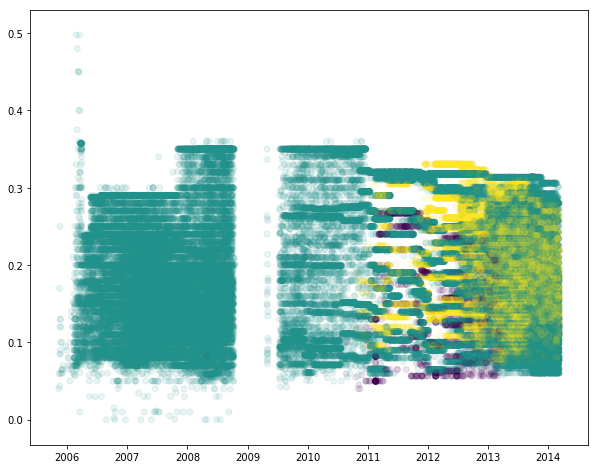

In [19]:
fig, ax = plt.subplots(figsize = (10,8))
ax.scatter(df.ListingCreationDate.values, df.BorrowerRate.values, alpha=0.1, c=df.Term);

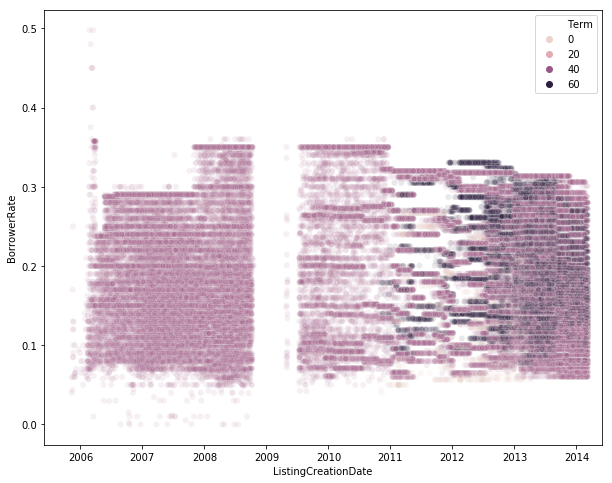

In [20]:
plt.figure(figsize=[10, 8])
sb.scatterplot(x="ListingCreationDate", y="BorrowerRate", hue='Term', alpha=0.1, data=df)
plt.xlim('2005-06-01', '2014-06-01');

>How interest rate is distributed and how 1Yr 3Yr and 5Yr loans are provided. Clearly interest rates were very high for some loans to begin with and 5Yr loans are started later.

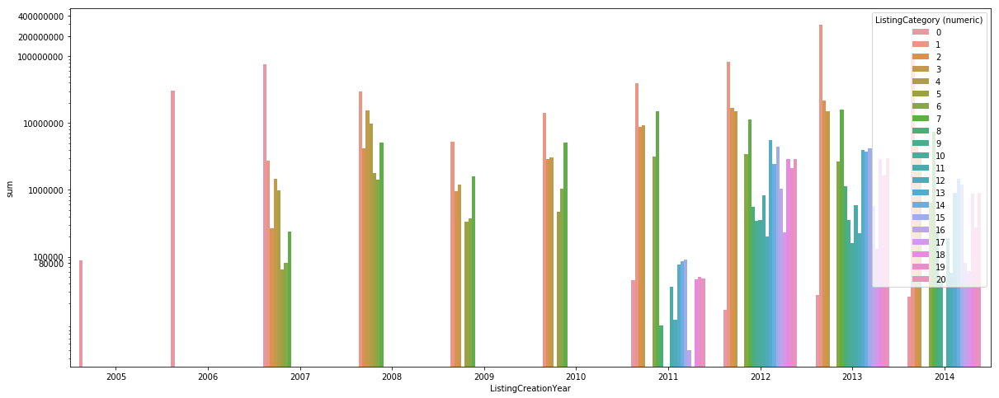

In [38]:
plt.figure(figsize=[20, 8])
sb.barplot(x="ListingCreationYear", y='sum', hue='ListingCategory (numeric)', data=df_loan_amt_each_year)
plt.yscale('log')
tick_locs = [80000, 100000, 1000000, 10000000, 100000000, 200000000, 400000000]
plt.yticks(tick_locs, tick_locs);

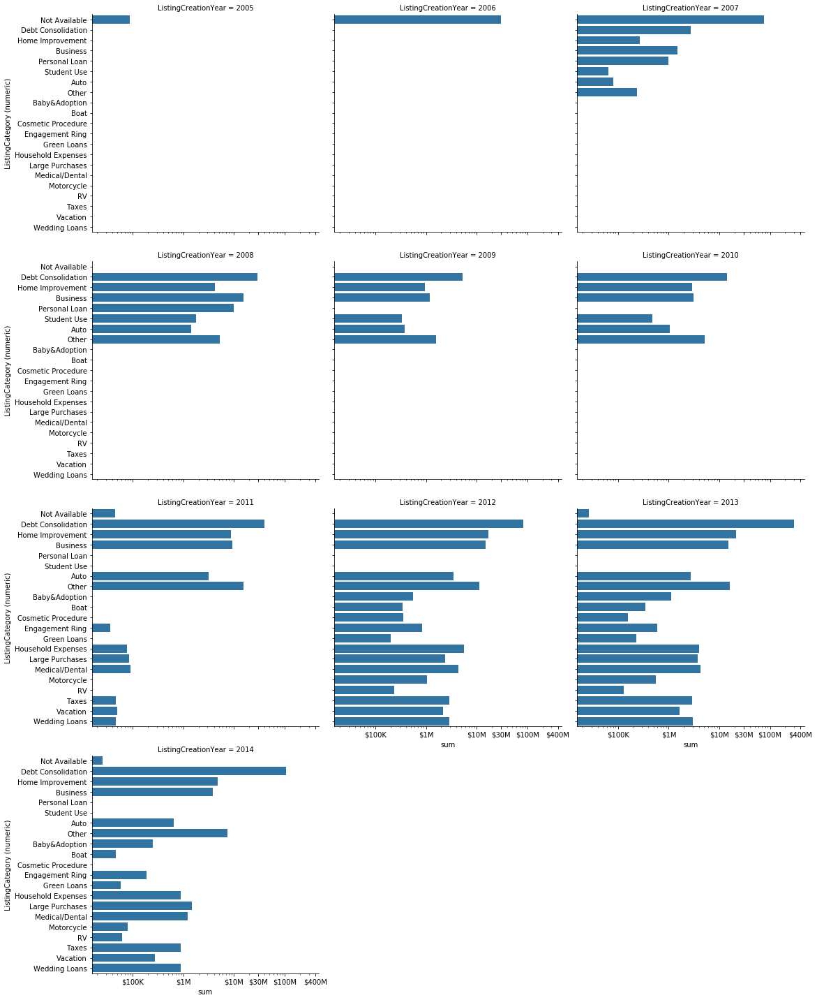

In [39]:
times = df_loan_amt_each_year['ListingCategory (numeric)'].unique()
g = sb.FacetGrid(data = df_loan_amt_each_year, col='ListingCreationYear', col_wrap=3, height=5)
g.map(sb.barplot, 'sum', 'ListingCategory (numeric)', orient="h", order=times)

plt.xscale('log')
tick_locs = [100000, 1000000, 10000000, 30000000, 100000000, 400000000]
tick_locs_t = ['$100K', '$1M', '$10M', '$30M', '$100M', '$400M']
plt.xticks(tick_locs, tick_locs_t)

y_tick_num = [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20]
y_tick = ['Not Available', 'Debt Consolidation', 'Home Improvement', 'Business', 'Personal Loan', 'Student Use', 'Auto', 'Other', 'Baby&Adoption', 'Boat', 'Cosmetic Procedure', 'Engagement Ring', 'Green Loans', 'Household Expenses', 'Large Purchases', 'Medical/Dental', 'Motorcycle', 'RV', 'Taxes', 'Vacation', 'Wedding Loans']
plt.yticks(y_tick_num, y_tick);

>How much loan provided each year in each category.

In [60]:
corr.style.background_gradient().set_precision(3)

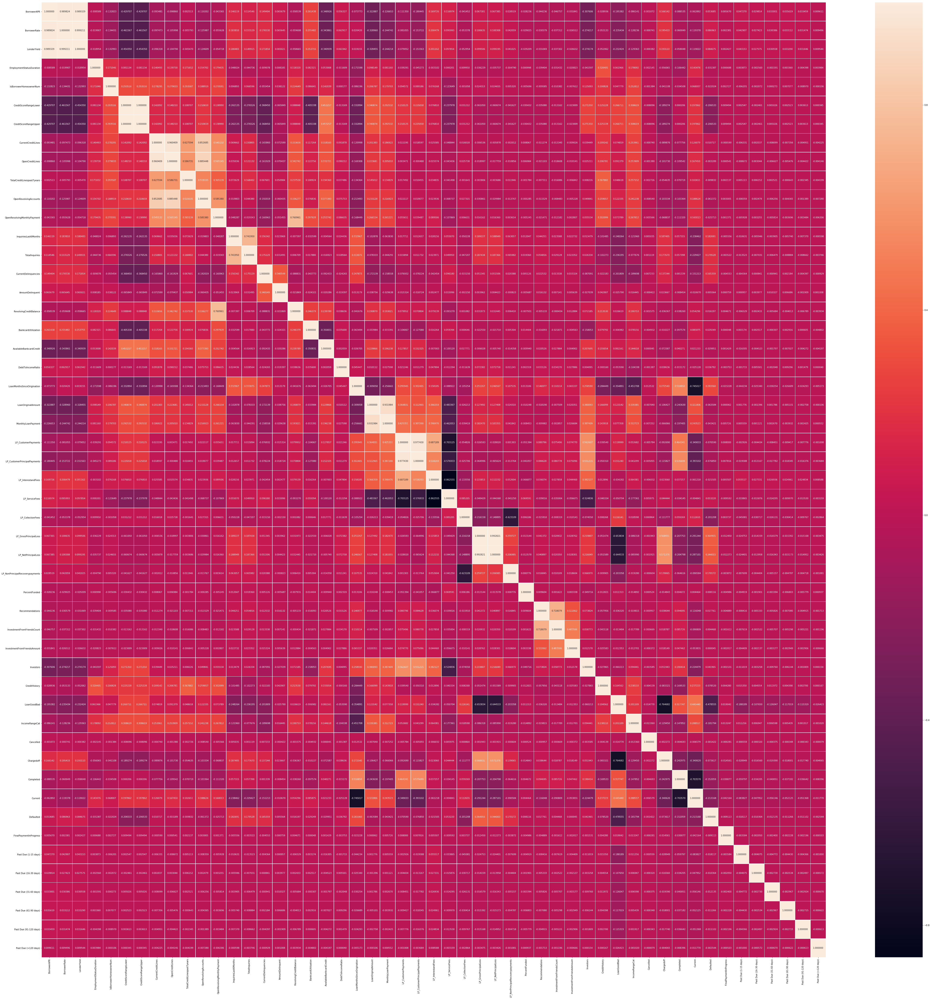

In [61]:
plt.figure(figsize=[80, 80])
sb.heatmap(corr, annot=True, fmt='f', linewidths=.5);

>Correlation between all numeric variables

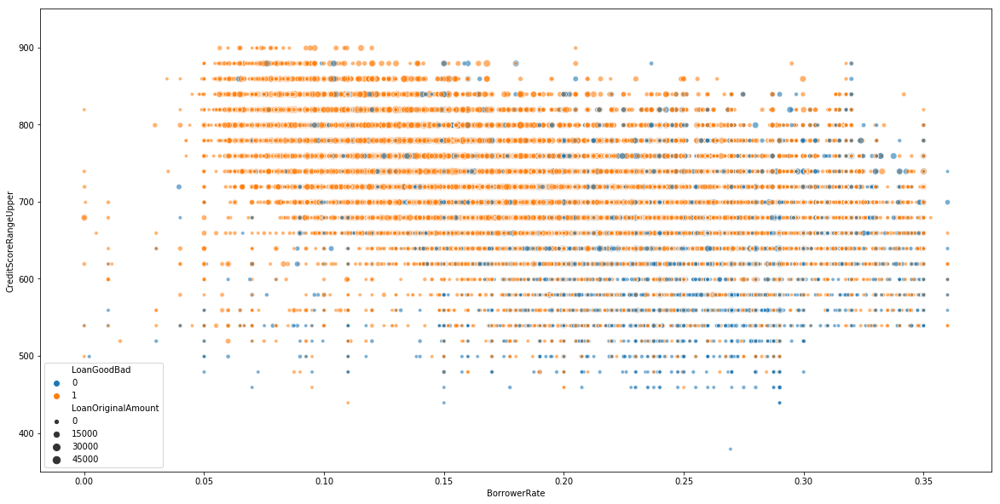

In [63]:
plt.figure(figsize=[20, 10])
sb.scatterplot(x="BorrowerRate", y="CreditScoreRangeUpper", hue='LoanGoodBad', size='LoanOriginalAmount', alpha=0.6, data=df)
plt.ylim(350, 950);

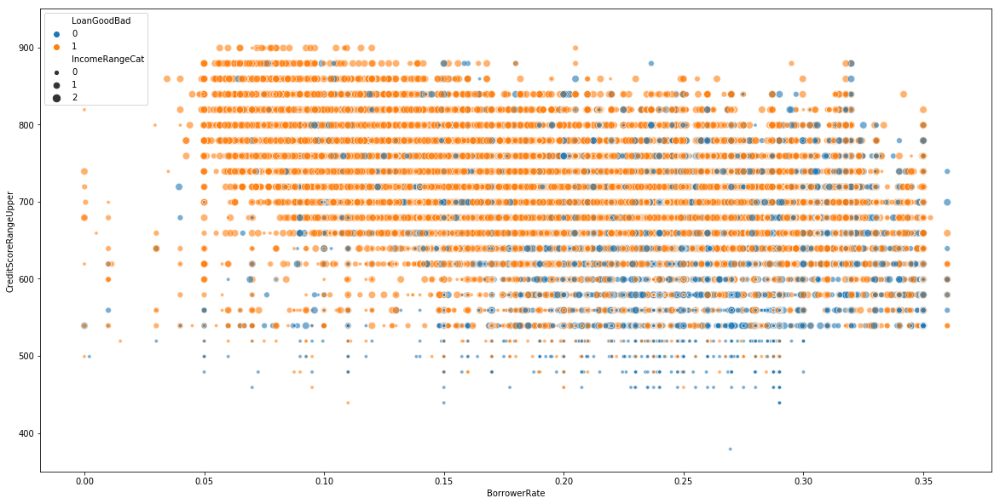

In [67]:
plt.figure(figsize=[20, 10])
sb.scatterplot(x="BorrowerRate", y="CreditScoreRangeUpper", hue='LoanGoodBad', size='IncomeRangeCat', alpha=0.6, data=df)
plt.ylim(350, 950);

/anaconda3/lib/python3.6/site-packages/scipy/stats/stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


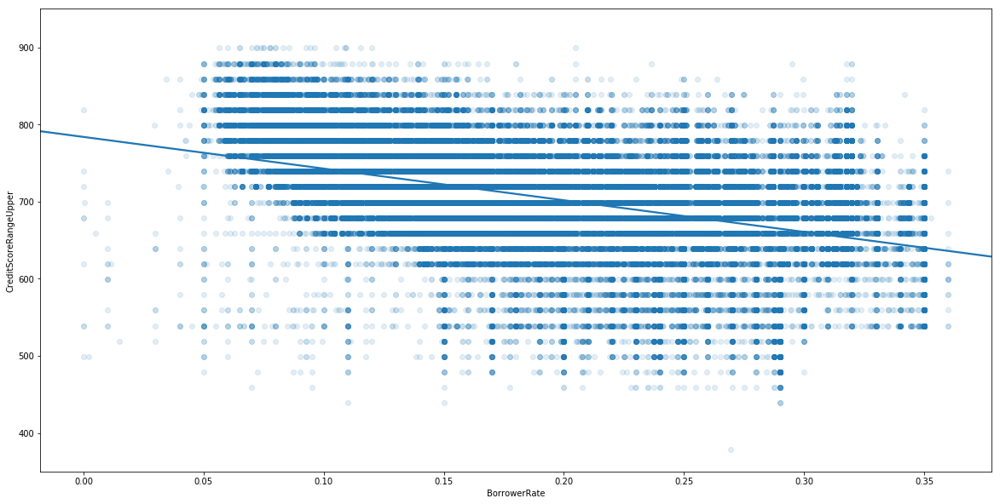

In [69]:
plt.figure(figsize=[20, 10])
sb.regplot(x="BorrowerRate", y="CreditScoreRangeUpper", scatter_kws={'alpha': 1/8}, data=df)
plt.ylim(350, 950);

>1. Credit Score is one factor in Loan outcome. Higher the score higher possible it being a good loan.
>2. Interest Rate is another factor. Lower the interest rate higher possible it being a good loan.

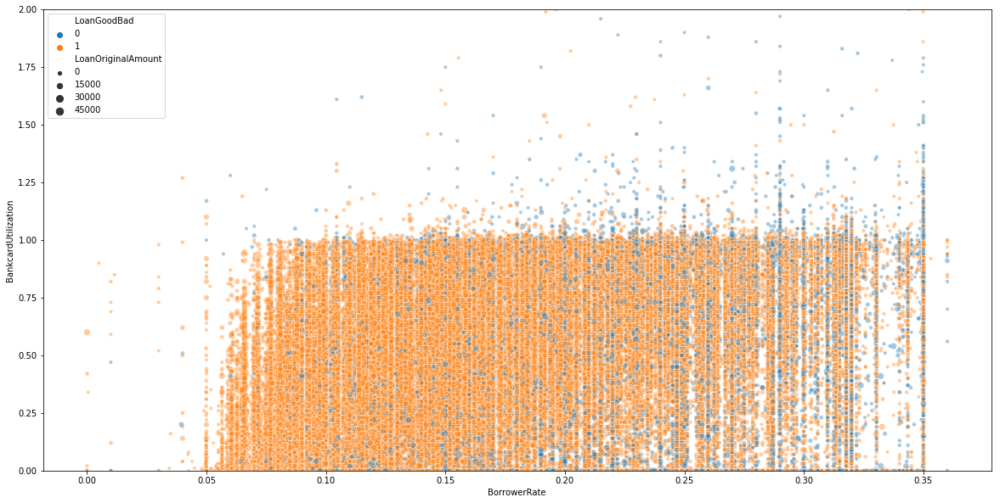

In [71]:
plt.figure(figsize=[20, 10])
sb.scatterplot(x="BorrowerRate", y="BankcardUtilization", hue='LoanGoodBad', size='LoanOriginalAmount', alpha=0.4, data=df)
plt.ylim(0, 2);

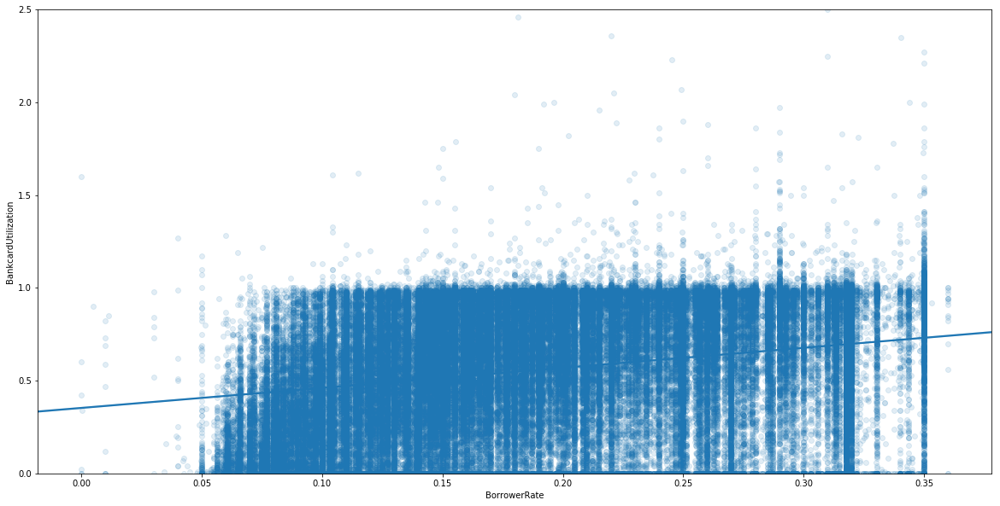

In [73]:
plt.figure(figsize=[20, 10])
sb.regplot(x="BorrowerRate", y="BankcardUtilization", scatter_kws={'alpha': 1/8}, data=df)
plt.ylim(0, 2.5);

>1. More one utilize their bank credit higher their loan interest rate goes.

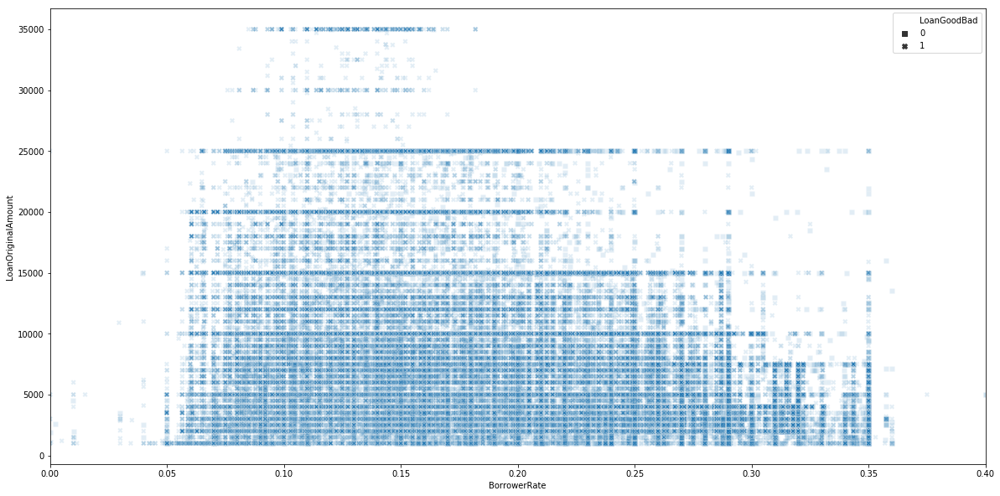

In [75]:
plt.figure(figsize=[20, 10])
markers = {0: "s", 1: "X"}
sb.scatterplot(x="BorrowerRate", y="LoanOriginalAmount", style='LoanGoodBad', markers=markers, alpha=1/8, data=df);
plt.xlim(0.0, 0.4);

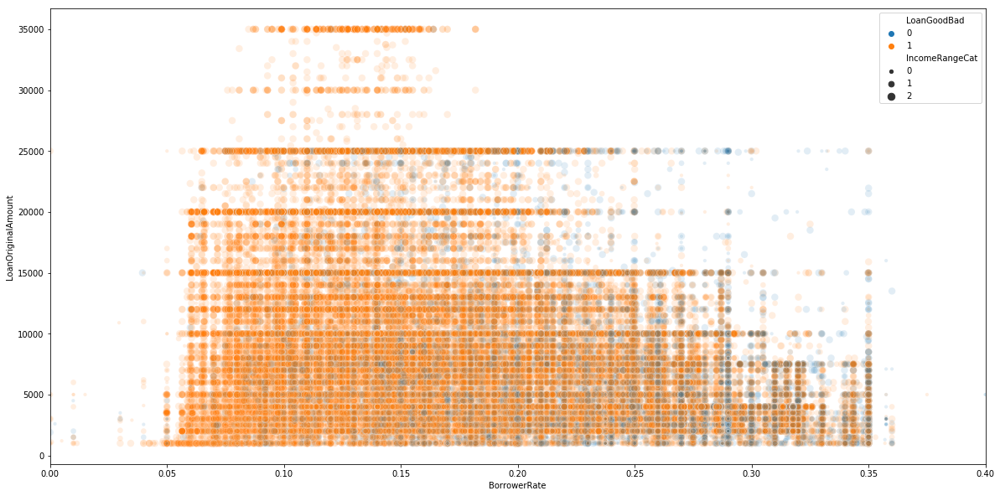

In [77]:
plt.figure(figsize=[20, 10])
sb.scatterplot(x="BorrowerRate", y="LoanOriginalAmount", hue='LoanGoodBad', size='IncomeRangeCat', alpha=1/8, data=df)
plt.xlim(0.0, 0.4);

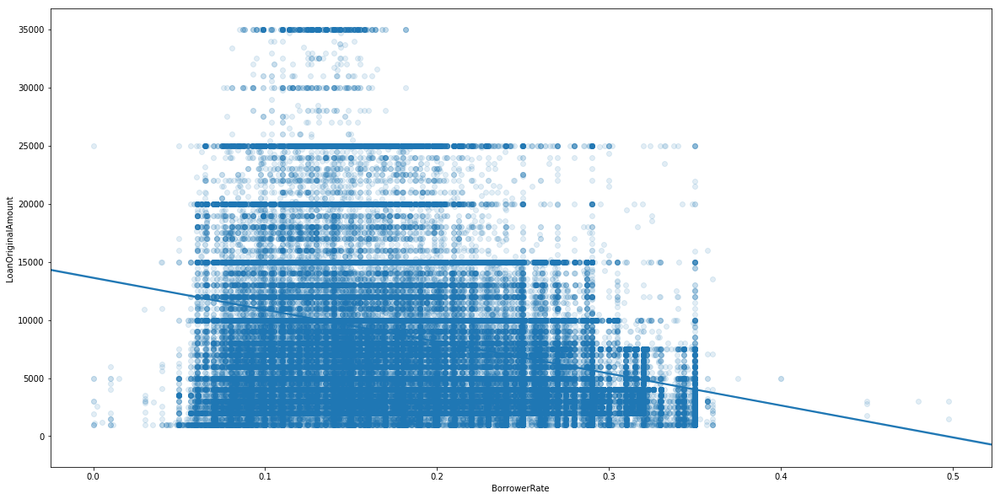

In [78]:
plt.figure(figsize=[20, 10])
sb.regplot(x="BorrowerRate", y='LoanOriginalAmount', scatter_kws={'alpha': 1/8}, data=df);

> 1. Higher loan get lower Interest Rate.

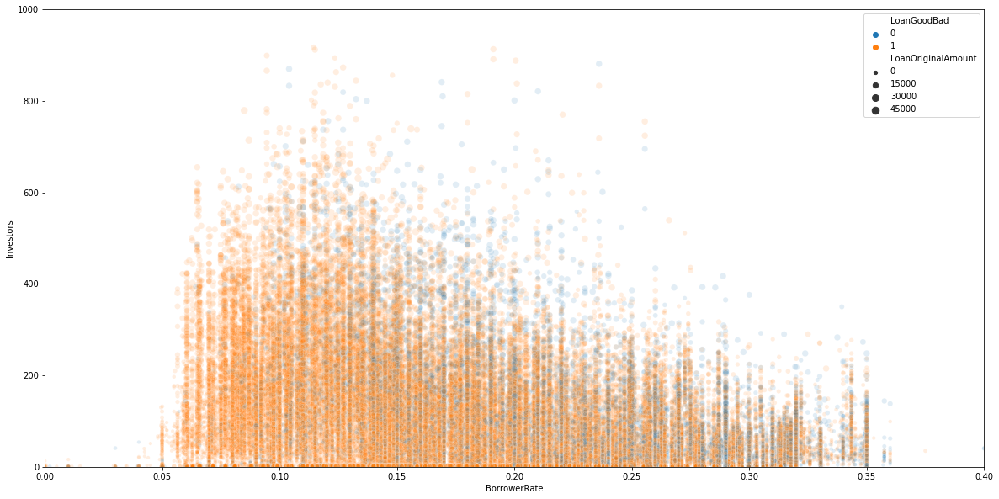

In [80]:
plt.figure(figsize=[20, 10])
sb.scatterplot(x="BorrowerRate", y='Investors', hue='LoanGoodBad', size='LoanOriginalAmount', alpha=1/8, data=df)
plt.xlim(0.0, 0.4)
plt.ylim(0, 1000);

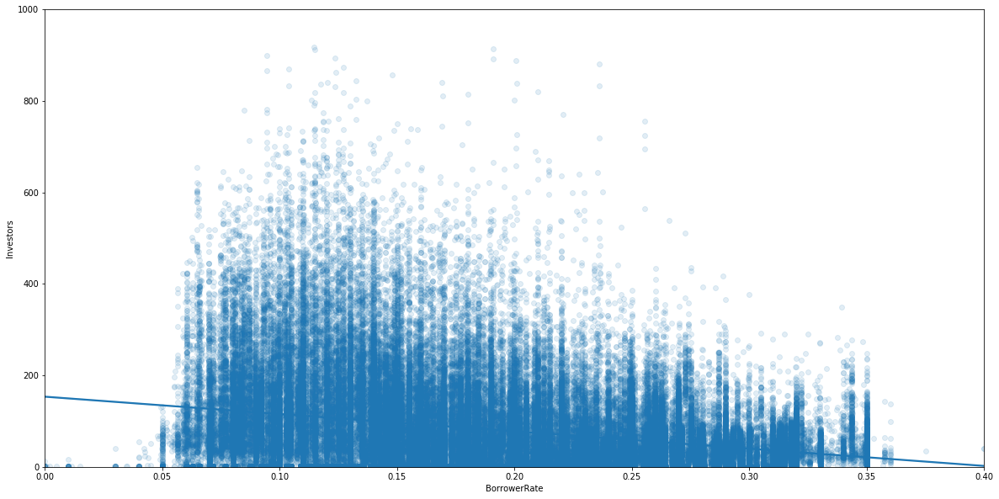

In [82]:
plt.figure(figsize=[20, 10])
sb.regplot(x="BorrowerRate", y='Investors', scatter_kws={'alpha': 1/8}, data=df);
plt.xlim(0.0, 0.4)
plt.ylim(0, 1000);

>1. Lower interest rate loans get more Investers.

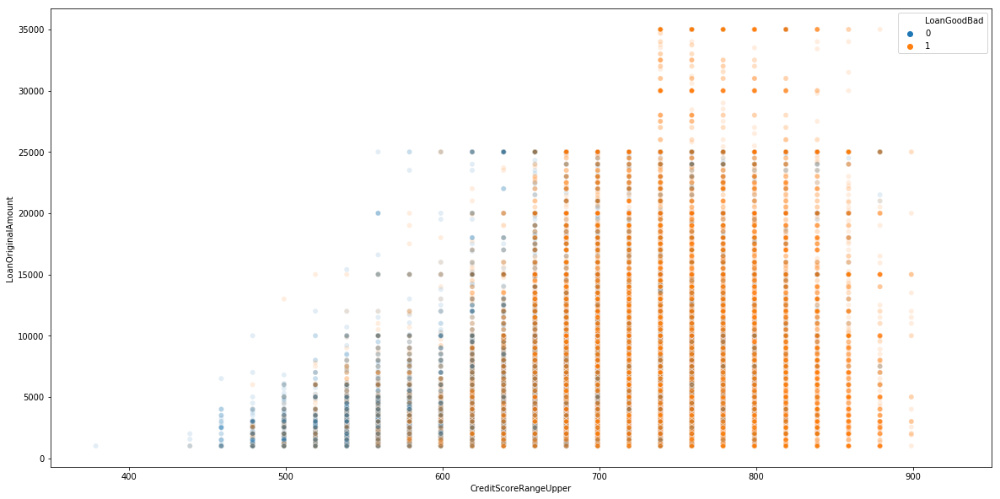

In [86]:
plt.figure(figsize=[20, 10])
sb.scatterplot(x="CreditScoreRangeUpper", y='LoanOriginalAmount', hue='LoanGoodBad', alpha=1/8, data=df)
plt.xlim(350, 950);

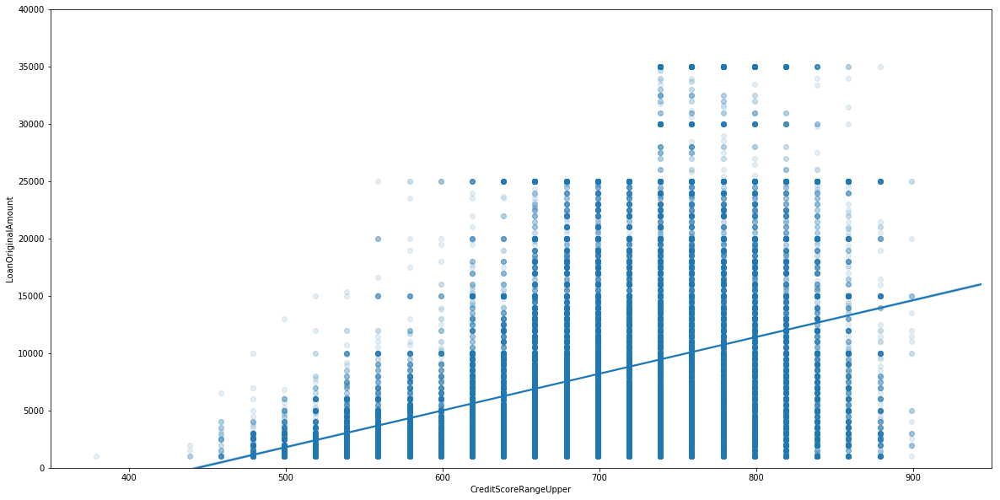

In [85]:
plt.figure(figsize=[20, 10])
sb.regplot(x='CreditScoreRangeUpper', y='LoanOriginalAmount', scatter_kws={'alpha': 1/8}, data=df);
plt.xlim(350, 950)
plt.ylim(0, 40000);

>1. Good loans are associated with higher credit score.
>2. Higher the Credit Score higher the loan amount given.

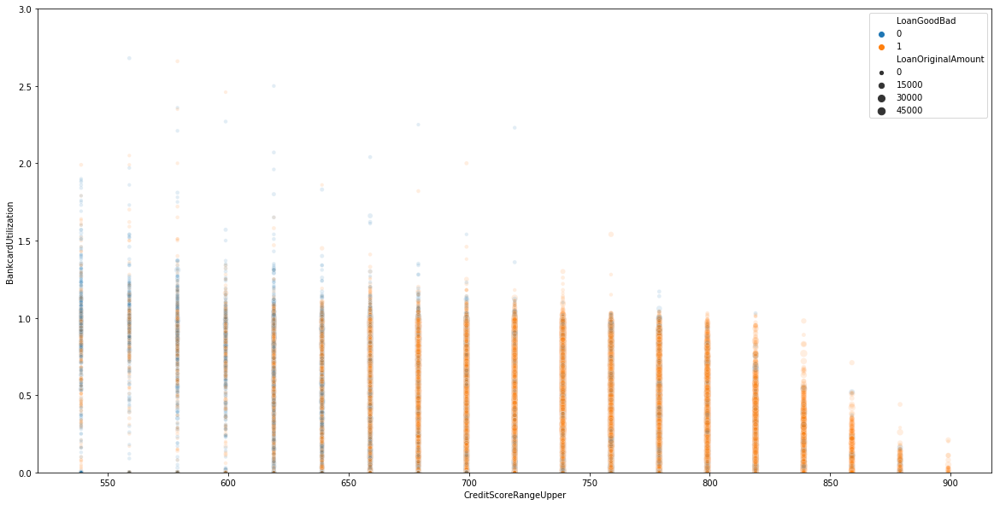

In [88]:
plt.figure(figsize=[20, 10])
sb.scatterplot(x="CreditScoreRangeUpper", y='BankcardUtilization', hue='LoanGoodBad', size='LoanOriginalAmount', alpha=1/8, data=df);
plt.ylim(0, 3);

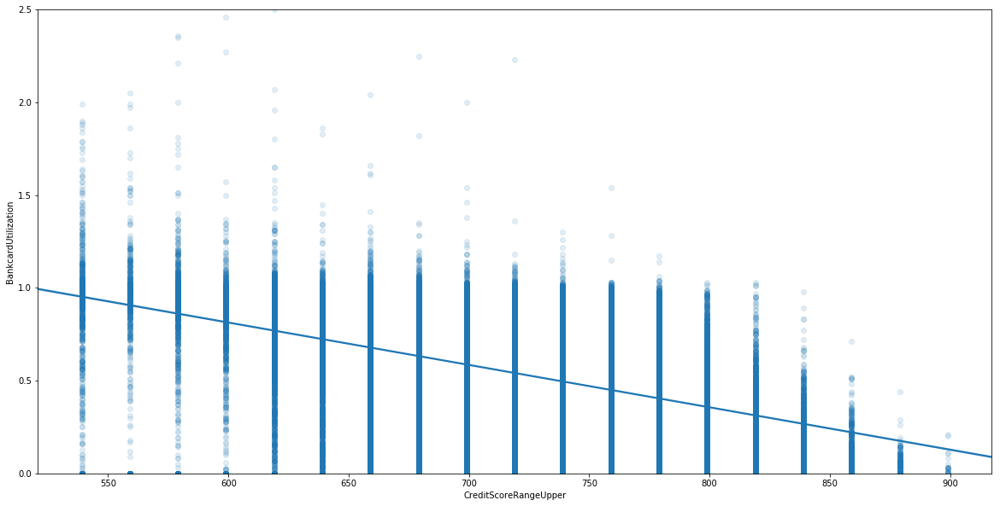

In [89]:
plt.figure(figsize=[20, 10])
sb.regplot(x='CreditScoreRangeUpper', y='BankcardUtilization', scatter_kws={'alpha': 1/8}, data=df)
plt.ylim(0, 2.5);

>One having higher Bank credit utilization tends to result in lower credit score.

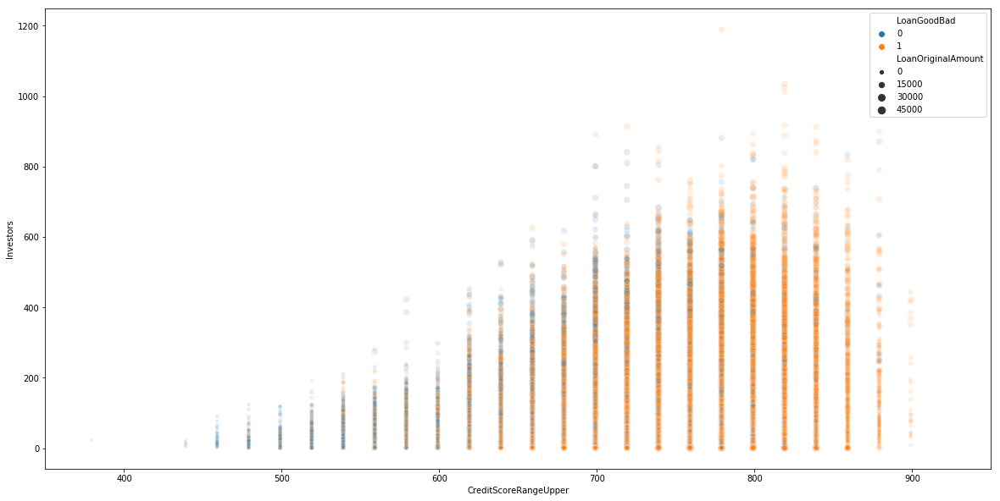

In [91]:
plt.figure(figsize=[20, 10])
sb.scatterplot(x="CreditScoreRangeUpper", y='Investors', hue='LoanGoodBad', size='LoanOriginalAmount', alpha=1/8, data=df);
plt.xlim(350, 950);

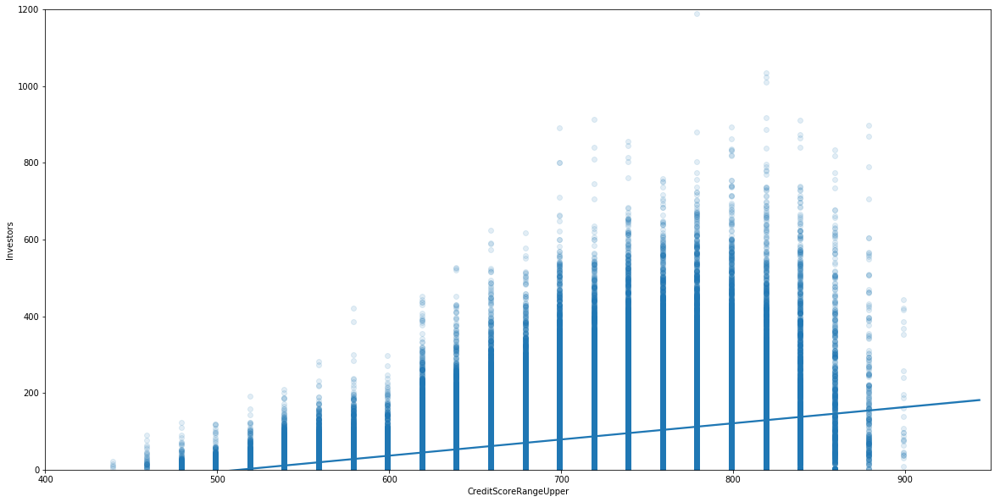

In [92]:
plt.figure(figsize=[20, 10])
sb.regplot(x='CreditScoreRangeUpper', y='Investors', scatter_kws={'alpha': 1/8}, data=df)
plt.ylim(0, 1200)
plt.xlim(400, 950);

>Higher Credit Score also one factor Investors interested in loan.

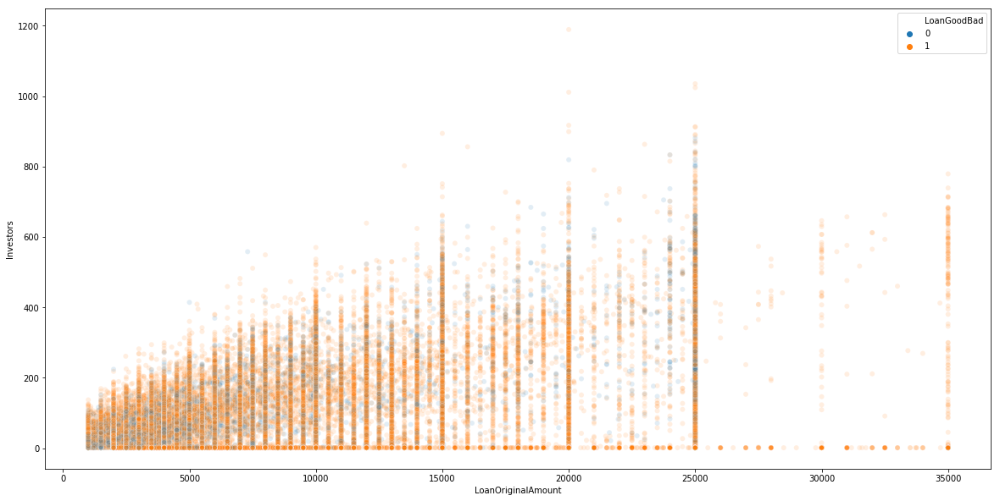

In [94]:
plt.figure(figsize=[20, 10])
sb.scatterplot(x='LoanOriginalAmount', y='Investors', hue='LoanGoodBad', alpha=1/8, data=df);

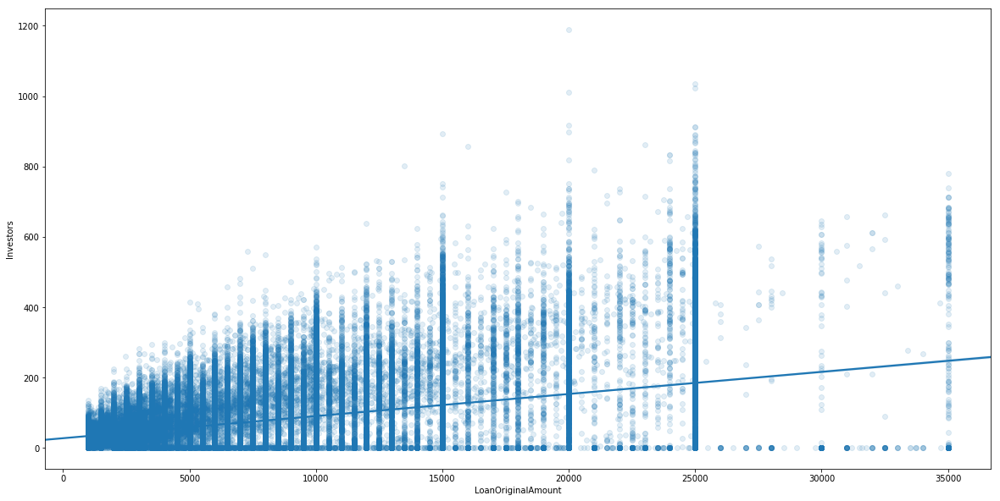

In [96]:
plt.figure(figsize=[20, 10])
sb.regplot(x='LoanOriginalAmount', y='Investors', scatter_kws={'alpha': 1/8}, data=df);

>Higher loan amount more Investors to invest.

### Talk about some of the relationships you observed in this part of the investigation. Were there features that strengthened each other in terms of looking at your feature(s) of interest?

>1. Credit Score is one factor in Loan outcome. Higher the score higher possible it being a good loan.
>2. Interest Rate is another factor. Lower the interest rate higher possible it being a good loan amount.
>3. More one utilize their bank credit higher their loan interest rate goes.
>4. Higher loan get lower Interest Rate.
>5. Good loans are associated with higher credit score.
>6. Higher the Credit Score higher the loan amount given.
>7. Higher loan amount more Investors to invest.

### Were there any interesting or surprising interactions between features?

>1. Lower interest rate loans get more Investers.
>2. One having higher Bank credit utilization tends to result in lower credit score.
>3. Higher Credit Score also one factor Investors interested in loan.


> At the end of your report, make sure that you export the notebook as an
html file from the `File > Download as... > HTML` menu. Make sure you keep
track of where the exported file goes, so you can put it in the same folder
as this notebook for project submission. Also, make sure you remove all of
the quote-formatted guide notes like this one before you finish your report!